# Image Captioning

In this notebook we will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="images/encoder_decoder.png" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

# Import stuff

In [11]:
import sys
sys.path.append("..")
import grading
import download_utils

In [12]:
download_utils.link_all_keras_resources()

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers as L
import utils
import time
import zipfile
import json
from collections import defaultdict
import re
import random
from random import choice
import os
import tqdm_utils

# Download data

Relevant links (just in case):
- train images http://msvocds.blob.core.windows.net/coco2014/train2014.zip
- validation images http://msvocds.blob.core.windows.net/coco2014/val2014.zip
- captions for both train and validation http://msvocds.blob.core.windows.net/annotations-1-0-3/captions_train-val2014.zip

In [14]:
# we downloaded them
download_utils.link_week_6_resources()

# Extract image features

We will use pre-trained InceptionV3 model for CNN encoder (https://research.googleblog.com/2016/03/train-your-own-image-classifier-with.html) and extract its last hidden layer as an embedding:

<img src="images/inceptionv3.png" style="width:70%">

In [15]:
IMG_SIZE = 299

In [16]:
# we take the last hidden layer of IncetionV3 as an image embedding
def get_cnn_encoder():
    keras.backend.set_learning_phase(False)
    model = keras.applications.InceptionV3(include_top=False)
    preprocess_for_model = keras.applications.inception_v3.preprocess_input

    model = keras.models.Model(model.inputs, keras.layers.GlobalAveragePooling2D()(model.output))
    return model, preprocess_for_model

Features extraction takes too much time on CPU:
- Takes 16 minutes on GPU.
- 25x slower (InceptionV3) on CPU and takes 7 hours.
- 10x slower (MobileNet) on CPU and takes 3 hours.

So we can do it as the following code:
```python
# load pre-trained model
encoder, preprocess_for_model = get_cnn_encoder()

# extract train features
train_img_embeds, train_img_fns = utils.apply_model(
    "train2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(train_img_embeds, "train_img_embeds.pickle")
utils.save_pickle(train_img_fns, "train_img_fns.pickle")

# extract validation features
val_img_embeds, val_img_fns = utils.apply_model(
    "val2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(val_img_embeds, "val_img_embeds.pickle")
utils.save_pickle(val_img_fns, "val_img_fns.pickle")

# sample images for learners
def sample_zip(fn_in, fn_out, rate=0.01, seed=42):
    np.random.seed(seed)
    with zipfile.ZipFile(fn_in) as fin, zipfile.ZipFile(fn_out, "w") as fout:
        sampled = filter(lambda _: np.random.rand() < rate, fin.filelist)
        for zInfo in sampled:
            fout.writestr(zInfo, fin.read(zInfo))
            
sample_zip("train2014.zip", "train2014_sample.zip")
sample_zip("val2014.zip", "val2014_sample.zip")
```

In [17]:
# load prepared embeddings
train_img_embeds = utils.read_pickle("train_img_embeds.pickle")
train_img_fns = utils.read_pickle("train_img_fns.pickle")
val_img_embeds = utils.read_pickle("val_img_embeds.pickle")
val_img_fns = utils.read_pickle("val_img_fns.pickle")
# check shapes
print(train_img_embeds.shape, len(train_img_fns))
print(val_img_embeds.shape, len(val_img_fns))

(82783, 2048) 82783
(40504, 2048) 40504


In [18]:
# check prepared samples of images
list(filter(lambda x: x.endswith("_sample.zip"), os.listdir(".")))

['val2014_sample.zip', 'train2014_sample.zip']

# Extract captions for images

In [19]:
# extract captions from zip
def get_captions_for_fns(fns, zip_fn, zip_json_path):
    zf = zipfile.ZipFile(zip_fn)
    j = json.loads(zf.read(zip_json_path).decode("utf8"))
    id_to_fn = {img["id"]: img["file_name"] for img in j["images"]}
    fn_to_caps = defaultdict(list)
    for cap in j['annotations']:
        fn_to_caps[id_to_fn[cap['image_id']]].append(cap['caption'])
    fn_to_caps = dict(fn_to_caps)
    return list(map(lambda x: fn_to_caps[x], fns))
    
train_captions = get_captions_for_fns(train_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_train2014.json")

val_captions = get_captions_for_fns(val_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_val2014.json")

# check shape
print(len(train_img_fns), len(train_captions))
print(len(val_img_fns), len(val_captions))

82783 82783
40504 40504


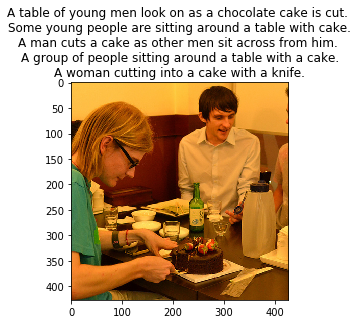

In [20]:
# look at training example (each has 5 captions)
def show_trainig_example(train_img_fns, train_captions, example_idx=0):
    """
    You can change example_idx and see different images
    """
    zf = zipfile.ZipFile("train2014_sample.zip")
    captions_by_file = dict(zip(train_img_fns, train_captions))
    all_files = set(train_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    img = utils.decode_image_from_buf(zf.read(example))
    plt.imshow(utils.image_center_crop(img))
    plt.title("\n".join(captions_by_file[example.filename.rsplit("/")[-1]]))
    plt.show()
    
show_trainig_example(train_img_fns, train_captions, example_idx=14)

# Prepare captions for training

In [21]:
# preview captions data
train_captions[:2]

[['A long dirt road going through a forest.',
  'A SCENE OF WATER AND A PATH WAY',
  'A sandy path surrounded by trees leads to a beach.',
  'Ocean view through a dirt road surrounded by a forested area. ',
  'dirt path leading beneath barren trees to open plains'],
 ['A group of zebra standing next to each other.',
  'This is an image of of zebras drinking',
  'ZEBRAS AND BIRDS SHARING THE SAME WATERING HOLE',
  'Zebras that are bent over and drinking water together.',
  'a number of zebras drinking water near one another']]

Before moving any further, we have to produce our vocabulary, which is a word to index mapping. This part might take hours to finish.

In [22]:
# special tokens
PAD = "#PAD#"
UNK = "#UNK#"
START = "#START#"
END = "#END#"

# split sentence into tokens (split into lowercased words)
def split_sentence(sentence):
    return list(filter(lambda x: len(x) > 0, re.split('\W+', sentence.lower())))

def generate_vocabulary(train_captions):
    """
    Return {token: index} for all train tokens (words) that occur 5 times or more, 
        `index` should be from 0 to N, where N is a number of unique tokens in the resulting dictionary.
    Use `split_sentence` function to split sentence into tokens.
    Also, add PAD (for batch padding), UNK (unknown, out of vocabulary), 
        START (start of sentence) and END (end of sentence) tokens into the vocabulary.
    """
    w = [split_sentence(s) for x in train_captions for s in x]
    words = [w for s in w for w in s] 
    words = words + [PAD, UNK, START, END]*5
    words.sort()
    print((words[:50]))
    vocab = set(filter(lambda x: words.count(x) > 4, words))
    print('here')
    vocab = {token: index for index, token in enumerate(vocab)}
    return vocab

In [25]:
# prepare vocabulary
vocab = generate_vocabulary(train_captions)
vocab_inverse = {idx: w for w, idx in vocab.items()}
print(len(vocab))

8769

In [26]:
def caption_tokens_to_indices(captions, vocab):
    """
    `captions` argument is an array of arrays:
    [
        [
            "image1 caption1",
            "image1 caption2",
            ...
        ],
        [
            "image2 caption1",
            "image2 caption2",
            ...
        ],
        ...
    ]
    Use `split_sentence` function to split sentence into tokens.
    Replace all tokens with vocabulary indices, use UNK for unknown words (out of vocabulary).
    Add START and END tokens to start and end of each sentence respectively.
    For the example above you should produce the following:
    [
        [
             ,
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    """
    
    def f(x):
        try:
            return vocab[x]
        except KeyError:
            return vocab[UNK]
            
    res = []
    for i in range(len(captions)):
        res.append([[vocab[START]]+list(map(lambda x: f(x), split_sentence(s)))+[vocab[END]] for s in captions[i] ])
    
    return res

In [27]:
# replace tokens with indices
train_captions_indexed = caption_tokens_to_indices(train_captions, vocab)
val_captions_indexed = caption_tokens_to_indices(val_captions, vocab)

Captions have different length but we need to batch them. That's why we will add PAD tokens so that all sentences have an equal length. 

We will crunch LSTM through all the tokens, but we will ignore padding tokens during loss calculation.

In [28]:
# we will use this during training
def batch_captions_to_matrix(batch_captions, pad_idx, max_len=None):
    """
    `batch_captions` is an array of arrays:
    [
        [vocab[START], ..., vocab[END]],
        [vocab[START], ..., vocab[END]],
        ...
    ]
    Put vocabulary indexed captions into np.array of shape (len(batch_captions), columns),
        where "columns" is max(map(len, batch_captions)) when max_len is None
        and "columns" = min(max_len, max(map(len, batch_captions))) otherwise.
    Add padding with pad_idx where necessary.
    Input example: [[1, 2, 3], [4, 5]]
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=None
    Output example: np.array([[1, 2], [4, 5]]) if max_len=2
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=100
    Try to use numpy, we need this function to be fast!
    """
    if max_len:
        columns= min(max_len, max(map(len, batch_captions)))
    else:
        columns= max(map(len, batch_captions))
    
        
    def f(x):
        if columns > len(x):
            return x+[pad_idx]*(columns-len(x))
        else:
            return x[:columns]
    
    batch = list(map(f, batch_captions))
    matrix = np.array(batch, dtype='int32')
    return matrix

In [29]:
# make sure you use correct argument in caption_tokens_to_indices
assert len(caption_tokens_to_indices(train_captions[:10], vocab)) == 10
assert len(caption_tokens_to_indices(train_captions[:5], vocab)) == 5

## Define architecture

Since our problem is to generate image captions, RNN text generator should be conditioned on images. _The idea is to use image features as an initial state for RNN instead of zeros_. 

Hence we should transform image feature vector to RNN hidden state size by fully-connected layer and then pass it to RNN.

During training we will feed ground truth tokens into the lstm to get predictions of next tokens. 

Notice that we don't need to feed last token (END) as input (http://cs.stanford.edu/people/karpathy/):

<img src="images/encoder_decoder_explained.png" style="width:50%">

In [30]:
IMG_EMBED_SIZE = train_img_embeds.shape[1]  #2048
IMG_EMBED_BOTTLENECK = 120
WORD_EMBED_SIZE = 100
LSTM_UNITS = 300
LOGIT_BOTTLENECK = 120
pad_idx = vocab[PAD]

Here's a figure to help you with flattening in decoder:
<img src="images/flatten_help.jpg" style="width:80%">

We first define CNN-Encoder whose inout is the output of InceptionV3 which will be called encoder_ later.

In [31]:
class CNN_Encoder(keras.Model):
    # We have already extracted the features for training
    # This encoder passes those features through a Fully connected layer
    def __init__(self):
        
        super(CNN_Encoder, self).__init__()
        # We use bottleneck here to reduce the number of parameters 
        self.dense_1 = L.Dense(IMG_EMBED_BOTTLENECK, 
                          input_shape=(None, IMG_EMBED_SIZE), 
                          activation='elu')
        
        # We condition RNN on images; This layer prepares initial states
        self.dense_2 = L.Dense(LSTM_UNITS,
                     input_shape=(None, IMG_EMBED_BOTTLENECK),
                     activation='elu')
        
    def call(self, x):
        x = self.dense_1(x)
        x = self.dense_2(x)
        return x

The output of CNN_Encoder pass through RNN-Decoder as initial _states_ of LSTM.

In [34]:
class RNN_Decoder(keras.Model):
    
    def __init__(self):
        
        super(RNN_Decoder, self).__init__()
        
        
        self.lstm = L.LSTM(LSTM_UNITS, return_sequences=True,
                          return_state=True)
        
        self.embed = L.Embedding(len(vocab), WORD_EMBED_SIZE)
        
        
        self.dense_3 = L.Dense(LOGIT_BOTTLENECK, 
                                  input_shape=(None, LSTM_UNITS),
                                  activation="elu")
        
        self.dense_4 = L.Dense(len(vocab),input_shape=(None, 
                                                LOGIT_BOTTLENECK))
 
    def call(self, states, sentences):
        
        c , h = states
        
        # shape = (None, MAX_LEN, WORD_EMBED_SIZE)
        word_embeds = self.embed(sentences)
        
        # shape = (None, MAX_LEN, LSTM_UNITS)
        hidden_states, c, h = self.lstm(word_embeds,
                                 initial_state=[c, h])
        
        
        flat_hidden_states = tf.reshape(hidden_states, shape=[-1, LSTM_UNITS])
        
        token_logits_bottleneck = self.dense_3(flat_hidden_states)

        token_logits = self.dense_4(token_logits_bottleneck)
        
        return token_logits, c, h
    

In [35]:
encoder = CNN_Encoder()
decoder = RNN_Decoder()

In [36]:
# define optimizer operation to minimize the loss
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

def loss_function(sentences, token_logits):
    flat_ground_truth = tf.reshape(sentences, [-1])
    xent = tf.nn.sparse_softmax_cross_entropy_with_logits(flat_ground_truth, token_logits)
    flat_loss_mask = tf.where(flat_ground_truth == pad_idx, 0., 1. )
    loss = tf.reduce_mean(xent*flat_loss_mask)
    return loss   

### Checkpoint

In [37]:

checkpoint_path = "checkpoints/train"
ckpt = tf.train.Checkpoint(decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
      start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
      # restoring the latest checkpoint in checkpoint_path
      ckpt.restore(ckpt_manager.latest_checkpoint)

## Training loop
Evaluate train and validation metrics through training and log them.

In [38]:
train_captions_indexed = np.array(train_captions_indexed)
val_captions_indexed = np.array(val_captions_indexed)

In [39]:
# generate batch via random sampling of images and captions for them,
# we use `max_len` parameter to control the length of the captions (truncating long captions)
def generate_batch(images_embeddings, indexed_captions, batch_size, max_len=None):
    """
    `images_embeddings` is a np.array of shape [number of images, IMG_EMBED_SIZE].
    `indexed_captions` holds 5 vocabulary indexed captions for each image:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    Generate a random batch of size `batch_size`.
    Take random images and choose one random caption for each image.
    Remember to use `batch_captions_to_matrix` for padding and respect `max_len` parameter.
    Return feed dict {decoder.img_embeds: ..., decoder.sentences: ...}.
    """
    rand = np.random.randint(images_embeddings.shape[0], size=batch_size)
    
    batch_image_embeddings = images_embeddings[rand]
    
    np.random.randint(0, 2)
    rand_capt = []
    
    for i in rand:
        rand_capt.append(indexed_captions[i][np.random.randint(0, 2)])
    
    batch_captions_matrix = batch_captions_to_matrix(rand_capt, pad_idx, max_len)
    
    return batch_image_embeddings, batch_captions_matrix

In [40]:
batch_size = 64
n_epochs = 12
n_batches_per_epoch = 1000
n_validation_batches = 100  # how many batches are used for validation after each epoch
MAX_LEN = 20  # truncate long captions to speed up training

### Training Loop

In [43]:
# to make training reproducible
np.random.seed(42)
random.seed(42)

for epoch in range(start_epoch, n_epochs):
    
    train_loss = 0
    pbar = tqdm_utils.tqdm_notebook_failsafe(range(n_batches_per_epoch))
    counter = 0
    for _ in pbar:
        img_embeds, sentences = generate_batch(train_img_embeds, 
                                               train_captions_indexed, 
                                               batch_size, 
                                               MAX_LEN)

        with tf.GradientTape() as tape:
            states = encoder(img_embeds)
            token_logits = decoder((states,states), sentences[:,:-1])[0]
            loss = loss_function(sentences[:,1:], token_logits)
        trainable_variables = encoder.trainable_variables + decoder.trainable_variables
        grads = tape.gradient(loss, trainable_variables)
        optimizer.apply_gradients(zip(grads, trainable_variables))
        train_loss += tf.keras.backend.eval(loss)
        counter += 1
        pbar.set_description("Training loss: %f" % (train_loss / counter))
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    for _ in range(n_validation_batches):
        img_embeds_val, sentences_val = generate_batch(val_img_embeds,
                                                   val_captions_indexed, 
                                                   batch_size, 
                                                   MAX_LEN)
        states = encoder(img_embeds_val)
        token_logits_val = decoder((states, states), sentences_val[:,:-1])[0]
        loss_val = loss_function(sentences_val[:,1:], token_logits_val)
        val_loss += tf.keras.backend.eval(loss_val)
    val_loss /= n_validation_batches
    
    print('Epoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))
    
    ckpt_manager.save()
    
print("Finished!")


Epoch: 10, train loss: 1.6731312395334244, val loss: 1.7226733362674713



Epoch: 11, train loss: 1.5854349167346955, val loss: 1.7119658446311952
Finished!


The model can be trained further if we allow more epoch. But we stop at this point.

In [44]:
decoder.summary()

Model: "rnn__decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  multiple                  481200    
_________________________________________________________________
embedding (Embedding)        multiple                  876900    
_________________________________________________________________
dense_4 (Dense)              multiple                  36120     
_________________________________________________________________
dense_5 (Dense)              multiple                  1061049   
Total params: 2,455,269
Trainable params: 2,455,269
Non-trainable params: 0
_________________________________________________________________


We can check what the moodel has learnt.

In [52]:
from sklearn.metrics import accuracy_score, log_loss

def decode_sentence(sentence_indices):
    return " ".join(list(map(vocab_inverse.get, sentence_indices)))

def check_after_training(n_examples):
    img_embeds, sentences = generate_batch(train_img_embeds, train_captions_indexed, batch_size)
    states = encoder(img_embeds)
    token_logits = decoder((states,states), sentences[:,:-1])[0]
    logits = keras.backend.eval(token_logits)
    truth = keras.backend.eval(tf.reshape(sentences[:,1:], [-1]))
    mask = np.where(truth == pad_idx, 0, 1 )
    print("Accuracy:", accuracy_score(logits.argmax(axis=1)[mask], truth[mask]))
    for example_idx in range(n_examples):
        print("Example", example_idx)
        print("Predicted:", decode_sentence(logits.argmax(axis=1).reshape((batch_size, -1))[example_idx]))
        print("Truth:", decode_sentence(truth.reshape((batch_size, -1))[example_idx]))
        print("")

check_after_training(3)

Accuracy: 0.57421875
Example 0
Predicted: a people on down a snow snowy mountain #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: two people ski down a large snowy hill #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 1
Predicted: a fire that is flow is the down #END# street #END# the is #END# #END# #END# #END# #END# #END# #END#
Truth: a sign detailing the fine for going around the gate when it s down #END# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 2
Predicted: a large plane plane is flying in a air #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: a small yellow plane is flying through the sky #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#



# Applying model

The prediction works as follows:
- take an image as an input and embed it 
- condition lstm on that embedding
- predict the next token given a START input token
- use predicted token as an input at next time step
- iterate until you predict an END token

In [46]:
encoder_, preprocess_for_model = get_cnn_encoder()

In [281]:
# look at how temperature works for probability distributions
# for high temperature we have more uniform distribution
_ = np.array([0.5, 0.4, 0.1])
for t in [0.01, 0.1, 1, 10, 100]:
    print(" ".join(map(str, _**(1/t) / np.sum(_**(1/t)))), "with temperature", t)

0.9999999997962965 2.0370359759195462e-10 1.2676505999700117e-70 with temperature 0.01
0.9030370433250645 0.09696286420394223 9.247099323648666e-08 with temperature 0.1
0.5 0.4 0.1 with temperature 1
0.35344772639219624 0.34564811360592396 0.3009041600018798 with temperature 10
0.33536728048099185 0.33461976434857876 0.3300129551704294 with temperature 100


In [49]:
# this is an actual prediction loop
def generate_caption(image, t=1, sample=False, max_len=20):
    """
    Generate caption for given image.
    if `sample` is True, we will sample next token from predicted probability distribution.
    `t` is a temperature during that sampling,
        higher `t` causes more uniform-like distribution = more chaos.
    """
    input_images = encoder_(image)
    states = encoder(input_images)
    # current caption
    # start with only START token
    caption = [vocab[START]]
    # condition lstm on the image
    init_c, init_h = states, states
        
    for _ in range(max_len):
        next_word_probs, new_c, new_h = decoder((init_c, init_h),np.array([[caption[-1]]], dtype='int32'))
        init_c, init_h = new_c, new_h
        next_word_probs = keras.backend.eval(tf.nn.softmax(next_word_probs))
        next_word_probs = next_word_probs.ravel()
        
        # apply temperature
        next_word_probs = next_word_probs**(1/t) / np.sum(next_word_probs**(1/t))

        if sample:
            next_word = np.random.choice(range(len(vocab)), p=next_word_probs)
        else:
            next_word = np.argmax(next_word_probs)

        caption.append(next_word)
        if next_word == vocab[END]:
            break
               
    return list(map(vocab_inverse.get, caption))

a baseball player swinging a bat at a ball


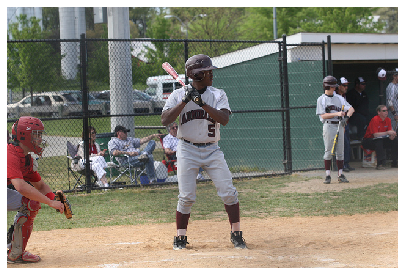

In [50]:
# look at validation prediction example
def apply_model_to_image_raw_bytes(raw):
    img = utils.decode_image_from_buf(raw)
    fig = plt.figure(figsize=(7, 7))
    plt.grid('off')
    plt.axis('off')
    plt.imshow(img)
    img = utils.crop_and_preprocess(img, (IMG_SIZE, IMG_SIZE), preprocess_for_model)
    print(' '.join(generate_caption(img[None,:], t=0.1)[1:-1]))
    plt.show()
    
def show_valid_example(val_img_fns, example_idx=0):
    zf = zipfile.ZipFile("val2014_sample.zip")
    all_files = set(val_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    apply_model_to_image_raw_bytes(zf.read(example))
    
show_valid_example(val_img_fns, example_idx=100)

a stop sign is on a pole near a street


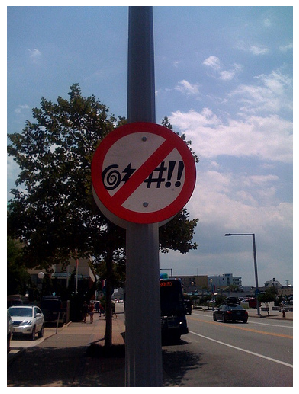

a large building with a clock on it


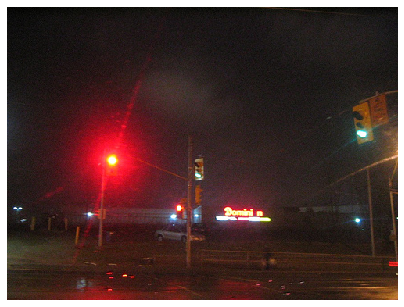

a man in a suit and tie on a laptop


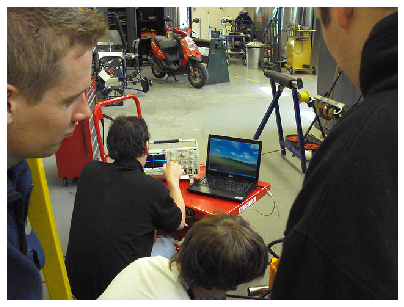

a woman sitting on a couch with a laptop


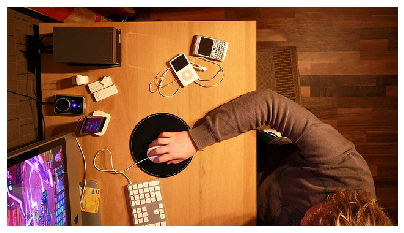

a man sitting at a table with a laptop


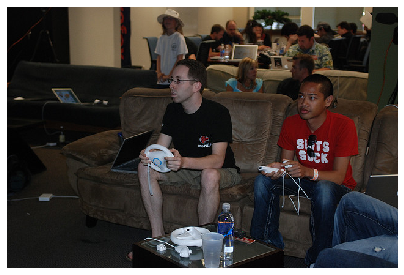

a double decker bus is parked in a parking lot


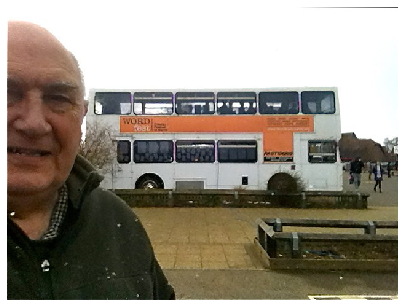

a boat sailing on a body of water


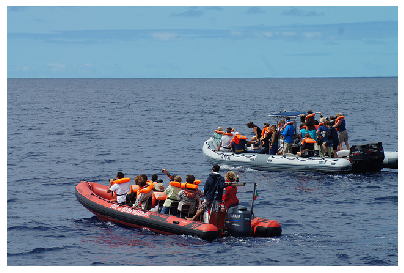

a man wearing a tie and a tie


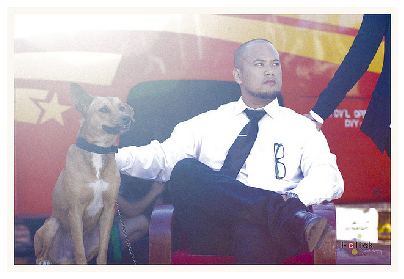

a boat is parked in a harbor with a large body of water


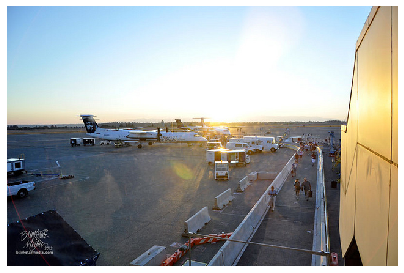

a dog is sitting on a bench in the snow


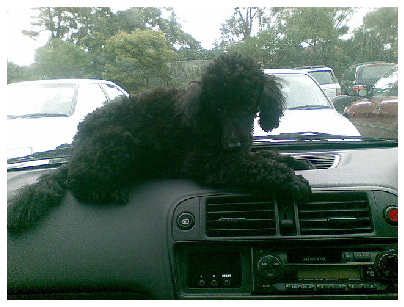

In [51]:
# sample more images from validation
for idx in np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 10):
    show_valid_example(val_img_fns, example_idx=idx)
    time.sleep(1)

### Some Examples from Validation Set

a table with a sandwich and a glass of wine


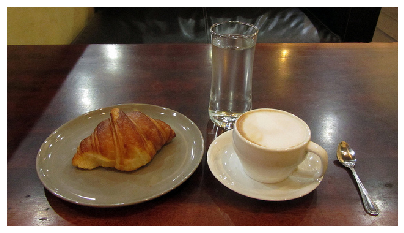

a herd of elephants walking across a dirt road


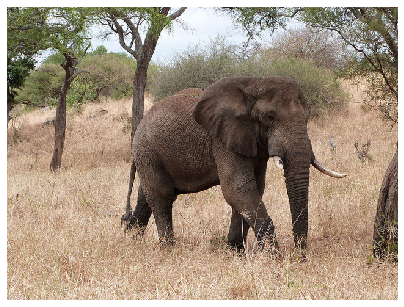

a laptop computer sitting on top of a desk


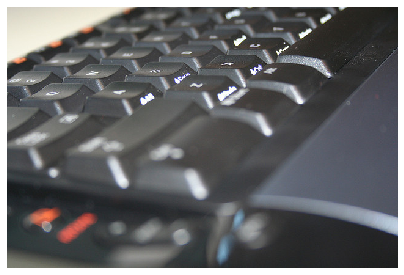

a man holding a cell phone in his hand


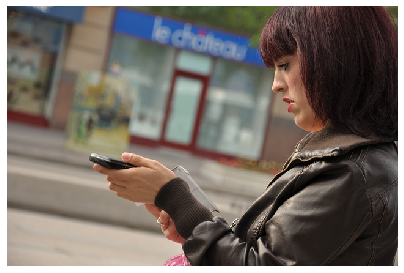

a woman is cutting a pizza with a knife


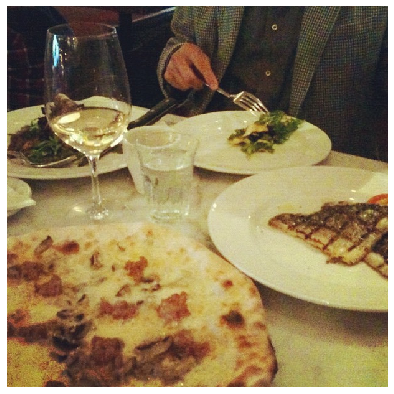

a large brown bear standing in a lush green field


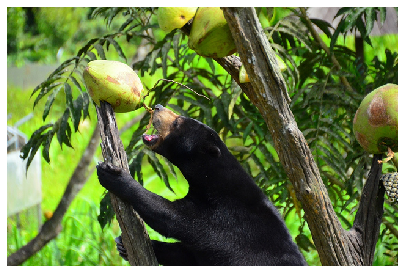

a motorcycle parked on a street next to a street


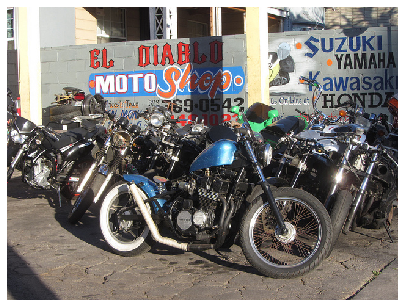

a dog is sitting on a bed with a cat


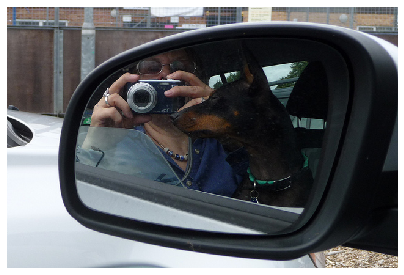

a man holding a cell phone in front of a mirror


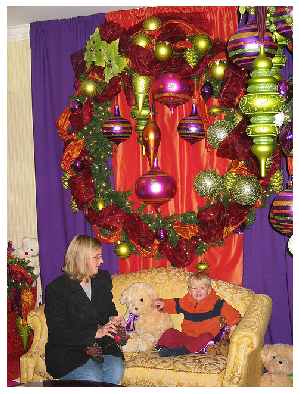

a plate of food with a knife and a fork


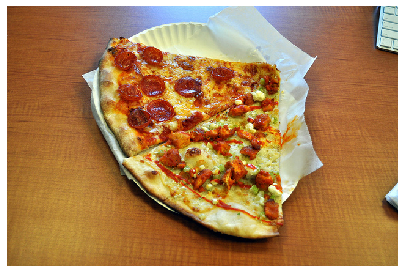

a man sitting on a couch with a laptop


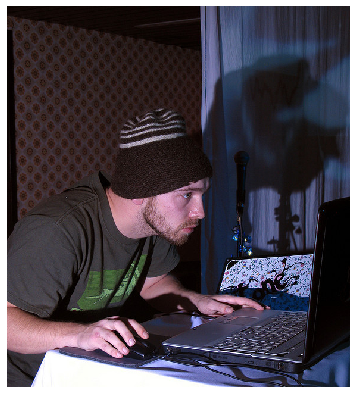

a man swinging a tennis racquet on a tennis court


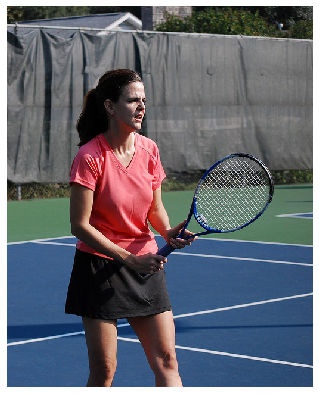

a white toilet sitting next to a toilet in a bathroom


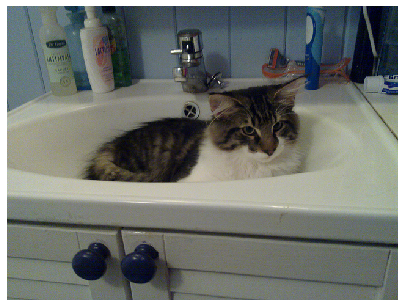

a man riding a surfboard on a wave in the ocean


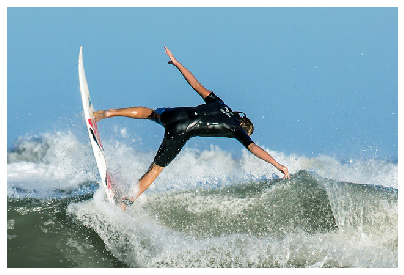

a train traveling down tracks next to a building


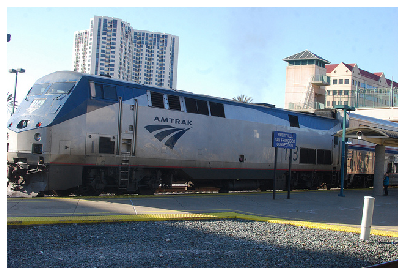

a man swinging a tennis racquet on a tennis court


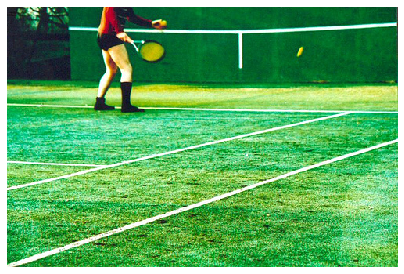

a man riding a bike on a street next to a bike


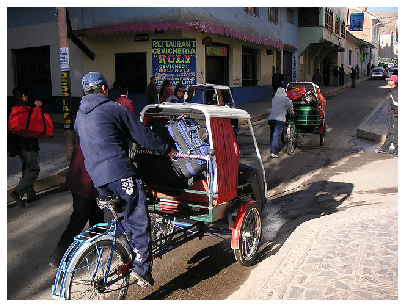

a man riding a surfboard on top of a wave


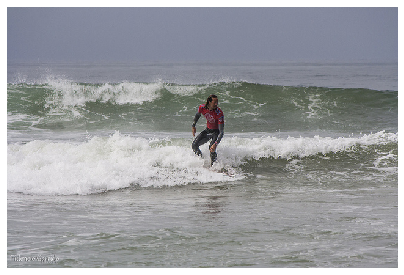

a cat is sitting on a bed with a cat


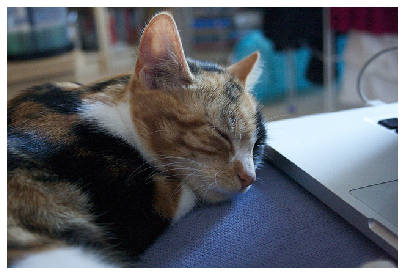

a cat sitting on a desk next to a laptop


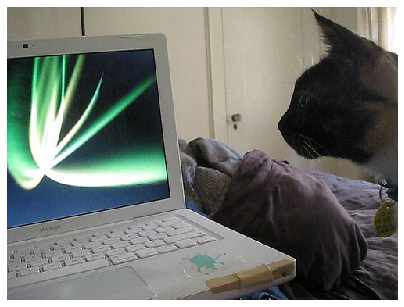

a man riding a bike on a city street


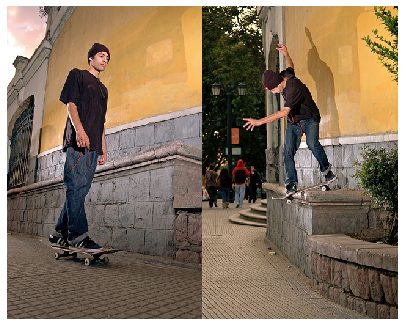

a man riding a surfboard on top of a wave


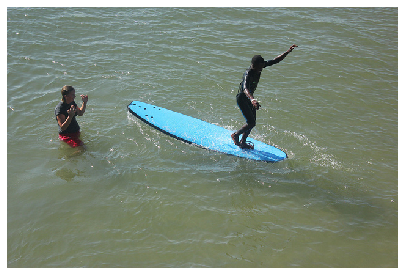

a man riding a surfboard on top of a wave


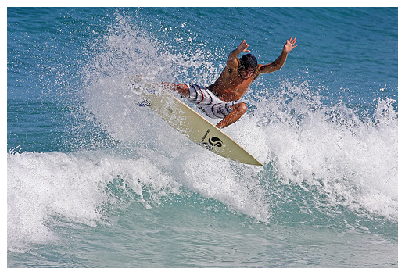

a man riding a motorcycle on a street


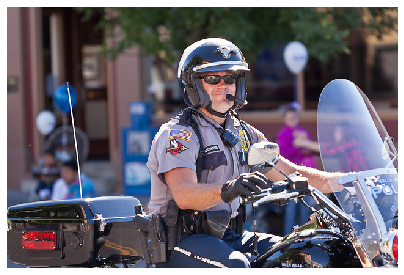

In [57]:
Good_examples_idx = [2, 3, 9, 15, 21, 24, 30, 33, 35, 37, 18, 92, 113, 124, 141, 142, 158, 212, 229, 236, 242, 340, 343, 359]
for idx in Good_examples_idx:
    show_valid_example(val_img_fns, example_idx=idx)
    